# Using NZRA as the station temperature measurement

Due to the uncertainty surrounding the correlation between station temperature and NZRA temperature (after taking the difference from ERA5, and normalizing), the model might be ignoring station measurements due to lack of certainty from station measurements when predicting NZRA. Formally:

$\text{With } \epsilon_{(x, y)} = (\text{ERA5}_{(x, y)} - \text{NZRA}_{(x, y)})$

$f(\epsilon) = Z_{x, y} = \frac{\epsilon_{x, y} - \overline{\epsilon_{x, y}}}{\sigma_[\epsilon_{x, y}]}$

ERA5 models seasonal and hourly temperature fluctuations, but fails to capture local-scale climate effects. Taking the difference of ERA5 and NZRA at point $(x, y)$ gives the error of ERA5. ERA5 is not an unbiased predictor - i.e. some temperatures are consistently over/under-estimated. The error can be normalized to remove systemic biases in the model, leaving the variable $Z_{(x, y)}$. At a timestamp t, the actual temperature can be decomposed as:

$\text{Temperature}_{(x, y)} = Z_{(x, y)}*\sigma_{[\epsilon_{x, y}]} + \overline{\epsilon_{x, y}} + \text{ERA5}_{(x, y)} $

Parameters $\sigma_{\epsilon_{x, y}}$ and $\overline{\epsilon_{x, y}}$ are found when fitting on the training set. Note - these may drift due to climate change, raising the mean temperature and potentially temperature variance. Parameter $\text{ERA5}_{(x, y)}$ is found from the ERA5 dataset. Hence the task becomes learning a function for $Z_{(x, y)}$. A gaussian convolutional neural process will be used for this.

By setting $\text{With } \epsilon_{(x, y)} = (\text{ERA5}_{(x, y)} - \text{Station}_{(x, y)})$, then $Z_{(x, y)}$ can be estimated at a point. The gaussian convolutional neural process can then interpolate this across points. An investigation preliminarily revealed that $Z_{station}$ is not strongly correlated with $Z_{NZRA}$. When training a ConvCNP using $Z_{station}$ as an input context set, the results were underwhelming. This may be due to slight issues in the NZRA dataset. While NZRA temperature strongly correlated with station temperature, once the difference from NZRA is taken and normalized, small errors in NZRA are exacerbated to the point that the normalized ERA5-station residuals do not strongly correlate with the normalized ERA5-NZRA residuals. Thus, the model does not attempt to interpolate the station readings, as they are not useful to predict the NZRA residual target.

To combat this, I propose using samples from $Z_{NZRA}$ in place of station readings while training, but then using station measurements at test/inference time. While this will not predict NZRA temperature at inference time (as the points being interpolated don't closely correlate to NZRA), the predictions may *better* represent real-world conditions, assuming the physics that governs the NZRA model is consistent with the physics of real-life weather. To evaluate the test error, held-out station observations could be used. Further design choices exist surrounding how NZRA points are sampled. I.e. should the model be only trained on NZRA samples from existing ground station areas, considering this is going to be all that is available at inference time? Or should the model train on a random sample of points over land? Should a hybrid approach be used?

I hope that by including accurate estimates of temperature in the context set, and a normalized dataset where converging to the mean is impossible (unless the model predicts 0 everywhere), then the model will be forced to learn how to interpolate station readings.

## Experiment Setup
- do imports
- set up project wide settings, variables, hyperparameters

In [1]:
%load_ext autoreload

In [2]:
# imports from this repo
%autoreload 2
from convcnp_assim_nz.config.logging_config import setup_logging
from convcnp_assim_nz.config.env_loader import use_absolute_filepaths, get_env_var
from convcnp_assim_nz.utils.variables.var_names import TEMPERATURE, PRECIPITATION, SURFACE_PRESSURE, HUMIDITY, WIND_SPEED, WIND_DIRECTION, WIND_U, WIND_V, VERTICAL_VELOCITY, GEOPOTENTIAL, SUN_CULMINATION, SUN_ANGLE, SEA_SURFACE_TEMPERATURE, TEMPERATURE_MIN, TEMPERATURE_MAX, SHORTWAVE_FLUX_DOWN, BAND_3, BAND_9, BAND_13, ELEVATION, TOPOGRAPHIC_POSITION_INDEX, LAND_SEA_MASK
from convcnp_assim_nz.utils.variables.coord_names import LATITUDE, LONGITUDE, TIME
from convcnp_assim_nz.data_processing.nzra_processor import ProcessNZRA
from convcnp_assim_nz.data_processing.topography_processor import ProcessTopography
from convcnp_assim_nz.data_processing.himawari8_processor import ProcessHimawari8
from convcnp_assim_nz.data_processing.era5_processor import ProcessERA5
from convcnp_assim_nz.data_processing.station_processor import ProcessStations
from convcnp_assim_nz.data_processing.conversions.scalar_conversions import kelvin_to_celsius
from convcnp_assim_nz.data_processing.auxiliary.sun_position import get_sun_culmination, get_sun_position
from convcnp_assim_nz.learning.model_training import train_epoch_pickled, compute_val_loss_pickled, return_sample_predictions
from convcnp_assim_nz.data_processing.normalize.coordinate_normalizer import CoordinateNormalizer

Loading environment variables from: /esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/.env


In [3]:
import os
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import deepsensor.torch
import torch
from torch.optim.lr_scheduler import CosineAnnealingLR
from torch.optim import Adam
from torch.utils.tensorboard import SummaryWriter
from mpl_toolkits.basemap import Basemap
import pickle
import logging
from datetime import datetime
import deepsensor.torch
from deepsensor.train.train import train_epoch, set_gpu_default_device, concat_tasks
from deepsensor.data.loader import TaskLoader
from deepsensor.data.processor import DataProcessor
from deepsensor.model.convnp import ConvNP
from deepsensor.data.utils import construct_x1x2_ds
from deepsensor.data.utils import compute_xarray_data_resolution, compute_pandas_data_resolution


In [4]:
# setup logging
setup_logging()  # configure logging
logger = logging.getLogger(__name__)
logger.info("Notebook execution started.")

# these are only used when the environment variables are not set - i.e. when debugging on a jupyter kernel
DEV_DEFAULT = "1"
DATASET_GEN_DEFAULT = "0"

# settings: development mode and dataset generation mode
dev = True if os.getenv("DEVELOPMENT_ENVIRONMENT", DEV_DEFAULT) == "1" else False
dataset_generation = True if os.getenv("DATASET_GENERATION", DATASET_GEN_DEFAULT) == "1" else False

# CUDA & filepath setup
logger.info(f"CUDA available: {torch.cuda.is_available()}")
if not os.environ["HOSTNAME"] in [
    'hub-worker01', 
    'hub-worker02', 
    'login01.slv.hpc.niwa.co.nz',
    'xd225v051.slv.hpc.niwa.co.nz' # when running on the shortq jupyter node, you will need to set this to the HOSTNAME variable. Run `echo $HOSTNAME` in the kernel terminal to get the correct value
    ] and not dataset_generation: # no GPU available on jupyter node. Dataset generation always on CPU
    set_gpu_default_device()

use_absolute_filepaths(True)

# setup tensorboard
TB_BASE = "/home/crowelenn/dev/convcnp-assim-nz"
TB_EXPERIMENT = "experiment4"

if dev:
    TB_PREFIX = "debug_runs"
else:
    TB_PREFIX = "runs"

EXPERIMENT_NAME = os.getenv("EXPERIMENT_NAME", "default_experiment")

# tensorboard tags
TB_TRAIN_LOSS = "Loss/Train"
TB_VAL_LOSS = "Loss/Validation"
TB_RUN_LOGS = "Run/Steps"
TB_EXAMPLE_TASK = "Tasks/Example"
TB_CUDA_MEM = "System/CUDA_Memory_MB"
TB_PREDICTIONS_TRAIN_PLOT = "Predictions/Train"
TB_PREDICTIONS_VAL_PLOT = "Predictions/Validation"
TB_LEARNING_RATE = "Hyperparameters/Learning_Rate"

if not dev:
    tb_path = os.path.join(TB_BASE, ".tensorboard", TB_EXPERIMENT, TB_PREFIX, f"run_{datetime.now().strftime('%d-%m-%YT%H:%M:%S')}")

    tb_writer = SummaryWriter(log_dir=tb_path)

2026-02-18 21:49:16 - INFO - __main__ - Notebook execution started.
2026-02-18 21:49:16 - INFO - __main__ - CUDA available: False


### Hyperparameters

In [5]:
# DATASET HYPERPARAMETERS

# variables for this experiment. 2017 will be saved for testing
years = [2013, 2014, 2015, 2016] # this gets modified later if PROCESS_YEAR is set
all_years = years.copy() # this needs to be kept

target_variable = [TEMPERATURE]

# if the target variable is not a list, make it one
if not isinstance(target_variable, list):
    target_variable = [target_variable]

target_variable_diff = [f"{var}_diff" for var in target_variable]

# exclude the first and last day of each year - occasionally have incomplete data on these days
# this is minimal data loss and avoids issues with incomplete data
time_slice = slice(f'{min(years)}-01-02T00:00:00', f'{max(years)}-12-30T23:00:00')

# you can set PROCESS_YEAR when running this notebook to only process a single year
# this allows parallelising dataset generation across multiple notebook runs
process_year = 2013
if os.getenv("PROCESS_YEAR") is not None and int(os.getenv("PROCESS_YEAR")) in years:
    process_year = int(os.getenv("PROCESS_YEAR"))
    years = [process_year]
    time_slice = slice(f'{process_year}-01-02T00:00:00', f'{process_year}-12-30T23:00:00')

if min(years) < 2017:
    load_himawari = False
else:
    load_himawari = True

TOPO_COARSEN = 2
H8_COARSEN = 2

NORM_SIZE = 100
TRAIN_SPLIT = 0.5 # 0.8 = 80% training, 20% validation

# LEARNING HYPERPARAMETERS
N_EPOCHS = 20
LR = 1e-3
BATCH_SIZE = 12
VAL_EVERY = 1
CHECKPOINT_EVERY = 50
UNET_CHANNELS = (32, 64, 128)
INTERNAL_DENSITY = 1111 // 2 # reduced from 1997 (from stations resolution)
INITIAL_NOISE = 1e-4
UNFIX_NOISE_AT_EPOCH = 0
TARGET_SAMPLING_COUNT = 1000 # not used when SAMPLING_STRATEGY is "all"
SAMPLING_STRATEGY = "all" # this overrides TARGET_SAMPLING_COUNT, and just samples all points

USE_GRAD_CLIP = False
GRAD_CLIP_VALUE = 1.0
EFFECTIVE_BATCH_SIZE = 48
GRAD_ACCUM_STEPS = EFFECTIVE_BATCH_SIZE // BATCH_SIZE

# override some hyperparameters for dev environment
if dev:
    years = [2013]

    time_slice = slice(f'{min(years)}-01-02T00:00:00', f'{max(years)}-01-27T23:00:00')
    #time_slice = slice(f'{min(years)}-01-02T00:00:00', f'{min(years)}-02-30T23:00:00')
    SAMPLING_STRATEGY = "all"
    NORM_SIZE = 100 # smaller norm size for dev

    N_EPOCHS = 10
    VAL_EVERY = 1

    INTERNAL_DENSITY = 1111 // 2
    INITIAL_NOISE = 5e-2
    UNFIX_NOISE_AT_EPOCH = 0

if not dev and not dataset_generation:
    # prod training.
    # we will reduce the time range for generating the norm_task_loader so we can run this with low memory
    # this will still train the model on the full dataset, and the norm_task_loader will fetch pre-computed norm params anyway.

    time_slice = slice(f'{min(years)}-01-02T00:00:00', f'{min(years)}-01-27T23:00:00')

In [6]:
# Logging

if not dev:
    tb_writer.add_text(TB_RUN_LOGS, f'Experiment 4 started {"in dataset generation mode" if dataset_generation else "without dataset generation"} {"in development mode." if dev else "in production mode."}', 0)
    tb_writer.flush()

if dataset_generation:
    logger.info("Data Preprocessing started. This notebook will run in dataset generation mode.")
else:
    logger.info("Data Preprocessing started. This notebook will not generate a dataset, and will load data from existing files.")

if dev:
    logger.warning("Running in development mode with reduced dataset sizes and increased coarsening.")

2026-02-18 21:49:17 - INFO - __main__ - Data Preprocessing started. This notebook will not generate a dataset, and will load data from existing files.
2026-02-18 21:49:17 - WARNING - __main__ - Running in development mode with reduced dataset sizes and increased coarsening.


## Preprocess the datasets

In [7]:
# load datasets

# data processors
topography_processor = ProcessTopography()
nzra_processor = ProcessNZRA()
era5_processor = ProcessERA5()
station_processor = ProcessStations(mode="csv")

# load datasets
topography_ds = topography_processor.load_ds()
nzra_ds = nzra_processor.load_ds(years=years)
era5_ds = era5_processor.load_ds(years=years)

if TEMPERATURE in target_variable:
    csv_file = '2013-2018_temps.csv'
if WIND_U in target_variable or WIND_V in target_variable:
    csv_file = '2013-2018_winds.csv'
# solar radiation not supported yet, but the SR file is: 2013-2018_radiation.csv

stations_df = station_processor.load_df(target_variable, csv_file=csv_file, year_start=min(years), year_end=max(years))

# filter datasets to time slice
nzra_ds = nzra_ds.sel(time=time_slice)
era5_ds = era5_ds.sel(time=time_slice)

logger.info("Lazy-loaded datasets successfully.")

2026-02-18 21:49:17 - INFO - fsspec.reference - Read reference from URL /esi/project/niwa00004/riom/data/nzra/nzra_20130101-20181231.json
2026-02-18 21:49:18 - INFO - fsspec.reference - Read reference from URL /esi/project/niwa00004/riom/data/nzra/nzra_20130101-20181231.json
2026-02-18 21:49:18 - INFO - fsspec.reference - Read reference from URL /esi/project/niwa00004/riom/data/nzra/nzra_20130101-20181231.json
2026-02-18 21:49:27 - INFO - __main__ - Lazy-loaded datasets successfully.


Loaded CSV with length 10897852
Loaded CSV with length 1648003


In [8]:
# Datasets need to be resampled to hourly frequency, + de-duplicated

nzra_ds = nzra_ds.sel(time=time_slice).chunk({"time": 24})
era5_ds = era5_ds.sel(time=time_slice).chunk({"time": 24})

target_time = nzra_ds.time.resample(time="1h").first()

nzra_ds = nzra_ds.reindex(time=target_time, method="nearest", tolerance="5min")
era5_ds = era5_ds.reindex(time=target_time, method="nearest", tolerance="5min")

stations_df = stations_df[
    stations_df['time'].isin(target_time.values)
]

logger.info("Datasets resampled to hourly frequency.")  

target_time_pd = pd.to_datetime(target_time.values)
stations_df = stations_df[
    (stations_df['time'] >= target_time_pd.min()) &
    (stations_df['time'] <= target_time_pd.max())
]

logger.info("Station data filtered to match NZRA time range.")    

logger.info(f"NZRA: {len(nzra_ds['time'])}, ERA5: {len(era5_ds['time'])}, Stations: {len(np.unique(stations_df['time'].values))}")

2026-02-18 21:49:28 - INFO - fsspec.reference - Read reference from URL /esi/project/niwa00004/riom/data/nzra/nzra_20130101-20181231.json
2026-02-18 21:49:28 - INFO - fsspec.reference - Read reference from URL /esi/project/niwa00004/riom/data/nzra/nzra_20130101-20181231.json
2026-02-18 21:49:28 - INFO - fsspec.reference - Read reference from URL /esi/project/niwa00004/riom/data/nzra/nzra_20130101-20181231.json
2026-02-18 21:49:28 - INFO - fsspec.reference - Read reference from URL /esi/project/niwa00004/riom/data/nzra/nzra_20130101-20181231.json
2026-02-18 21:49:28 - INFO - fsspec.reference - Read reference from URL /esi/project/niwa00004/riom/data/nzra/nzra_20130101-20181231.json
2026-02-18 21:49:28 - INFO - fsspec.reference - Read reference from URL /esi/project/niwa00004/riom/data/nzra/nzra_20130101-20181231.json
2026-02-18 21:49:28 - INFO - fsspec.reference - Read reference from URL /esi/project/niwa00004/riom/data/nzra/nzra_20130101-20181231.json
2026-02-18 21:49:29 - INFO - fsspe

#### Pre-process the stations data (pandas)

In [9]:
# preprocess the stations
stations_df = stations_df[target_variable + [LATITUDE, LONGITUDE, TIME]]

stations_reset = stations_df.reset_index()
stations_resample = stations_reset.groupby([LATITUDE, LONGITUDE]).resample("1h", on=TIME).mean()[target_variable]
stations_resample = stations_resample.reset_index().set_index([TIME, LATITUDE, LONGITUDE]).sort_index()

# resample stations to times in NZRA
target_time_pd = pd.to_datetime(target_time.values) 
stations_resample = stations_resample[stations_resample.index.get_level_values('time').isin(target_time_pd)]

# crop the stations to NZ bounds
crop_bottom = nzra_ds.lat.min().item()
crop_top = nzra_ds.lat.max().item()
crop_left = nzra_ds.lon.min().item()
crop_right = nzra_ds.lon.max().item()

stations_resample = stations_resample[(stations_resample.index.get_level_values('lat') > crop_bottom) & (stations_resample.index.get_level_values('lat') < crop_top) &
                                      (stations_resample.index.get_level_values('lon') > crop_left) & (stations_resample.index.get_level_values('lon') < crop_right)]

logger.info("Station Preprocessing complete.")

/var/tmp/pbs.1632954.pbsserver01/ipykernel_3485076/3224810285.py:5: FutureWarning: DataFrameGroupBy.resample operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  stations_resample = stations_reset.groupby([LATITUDE, LONGITUDE]).resample("1h", on=TIME).mean()[target_variable]
2026-02-18 21:49:36 - INFO - __main__ - Station Preprocessing complete.


### Pre-process NZRA

In [10]:
# preprocess NZRA
if TEMPERATURE in nzra_ds.data_vars:
    nzra_ds[TEMPERATURE] = kelvin_to_celsius(nzra_ds[TEMPERATURE])

nzra_ds = nzra_ds[target_variable + [LAND_SEA_MASK]]

if not nzra_ds.indexes['time'].is_unique:
    nzra_ds = nzra_ds.drop_duplicates(dim='time')
    logger.info("Dropping duplicate times from NZRA dataset.")

logger.info("NZRA Preprocessing complete.")

2026-02-18 21:49:36 - INFO - __main__ - NZRA Preprocessing complete.


#### Pre-process ERA5 Data

In [11]:
# preprocess ERA5
era5_ds = era5_ds.isel(level=-1) # select nearest to surface level (geopotential == 1000) only

# convert temperature from K to C
if TEMPERATURE in era5_ds.data_vars:
    era5_ds[TEMPERATURE] = kelvin_to_celsius(era5_ds[TEMPERATURE])

# add sun angle and culmination to ERA5 dataset
era5_ds[SUN_CULMINATION] = get_sun_culmination(era5_ds.coords)
era5_ds[SUN_ANGLE] = get_sun_position(era5_ds.coords)

if not era5_ds.indexes['time'].is_unique:
    era5_ds = era5_ds.drop_duplicates(dim='time')
    logger.info("Dropping duplicate times from ERA5 dataset.")

logger.info("ERA5 Preprocessing complete.")

2026-02-18 21:49:36 - INFO - __main__ - ERA5 Preprocessing complete.


2026-02-18 21:49:36 - INFO - __main__ - Computed difference between NZRA and ERA5 for variable temperature.


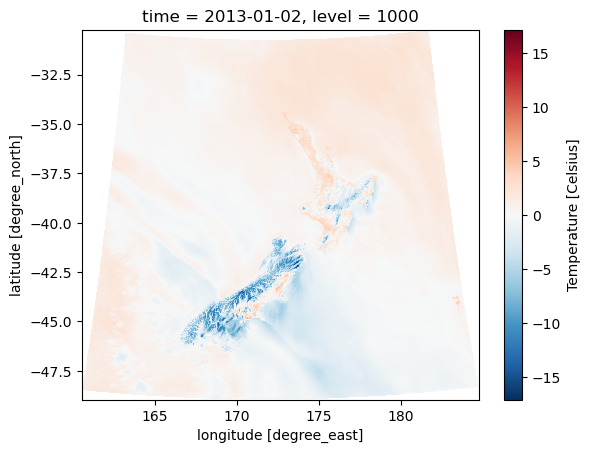

In [12]:
# calculate diffs for target variable in NZRA dataset
# ERA5 and NZRA are on different grids

for var in target_variable:
    var_diff = f"{var}_diff"

    # compute the difference between ERA5 and NZRA for this variable
    if var in era5_ds.data_vars:
        era5_interp = era5_ds[var].interp(lat=nzra_ds.lat, lon=nzra_ds.lon, method="linear")

        nzra_ds[f"{var}_diff"] = nzra_ds[var] - era5_interp
        logger.info(f"Computed difference between NZRA and ERA5 for variable {var}.")
    else:
        logger.warning(f"Variable {var} not found in ERA5 dataset. Cannot compute difference.")

    if dev:
        nzra_ds.isel(time=0)[var_diff].plot()
        plt.show()

#### Pre-process Auxilliary Data (topography)

In [13]:
# preprocess auxiliary dataset (topography, tpi, land/sea mask)
ds_aux = topography_processor.compute_tpi(topography_ds, window_sizes=[0.1])
ds_aux = ds_aux.reindex({LATITUDE: nzra_ds[LATITUDE], LONGITUDE: nzra_ds[LONGITUDE]}, method='nearest') # expand to the NZRA grid

ds_aux[LAND_SEA_MASK] = ds_aux[ELEVATION].where(ds_aux[ELEVATION].isnull(), 1, 0).fillna(0)

ds_aux_coarse  = ds_aux.coarsen(
    lat=TOPO_COARSEN, 
    lon=TOPO_COARSEN, 
    boundary='trim').mean()

ds_aux = ds_aux.fillna(0)
ds_aux_coarse = ds_aux_coarse.fillna(0)

logger.info("Auxiliary Preprocessing complete.")

2026-02-18 21:50:37 - INFO - __main__ - Auxiliary Preprocessing complete.


#### Crop datasets to matching square bounds

In [14]:
# crop all datasets to a square bound of lat -32.5, -47.5 and lon 165, 180
crop_bottom = -47.5
crop_top = -32.5
crop_left = 165.0
crop_right = 180.0

nzra_ds = nzra_ds.sel(lat=slice(crop_bottom, crop_top), lon=slice(crop_left, crop_right))
era5_ds = era5_ds.sel(lat=slice(crop_top, crop_bottom), lon=slice(crop_left, crop_right))
ds_aux = ds_aux.sel(lat=slice(crop_bottom, crop_top), lon=slice(crop_left, crop_right))
ds_aux_coarse = ds_aux_coarse.sel(lat=slice(crop_bottom, crop_top), lon=slice(crop_left, crop_right))

stations_resample = stations_resample[(stations_resample.index.get_level_values('lat') > crop_bottom) & (stations_resample.index.get_level_values('lat') < crop_top) &
                                      (stations_resample.index.get_level_values('lon') > crop_left) & (stations_resample.index.get_level_values('lon') < crop_right)]

logger.info("Datasets cropped to NZ region.")

2026-02-18 21:50:38 - INFO - __main__ - Datasets cropped to NZ region.


In [15]:
logger.info("Dataset preprocessing completed.")
if not dev:
    tb_writer.add_text(TB_RUN_LOGS, "Dataset preprocessing completed.", 1)
    tb_writer.flush()

2026-02-18 21:50:38 - INFO - __main__ - Dataset preprocessing completed.


## Final Filtering of datasets

This will vary by experiment.

In [16]:
# only select temperature + sun position from ERA5
era5_ds = era5_ds[[TEMPERATURE] + [SUN_ANGLE]]

# only select topography + lsm from auxiliary
ds_aux = ds_aux[[ELEVATION]]
ds_aux_coarse = ds_aux_coarse[[ELEVATION]]

# filter NZRA to only land points using the land-sea mask. Set sea points to NaN so they are ignored during training and evaluation
nzra_ds = nzra_ds.where(nzra_ds[LAND_SEA_MASK] == 1)

# select the diffs from NZRA as targets
nzra_ds = nzra_ds[target_variable_diff]

In [17]:
# get the NZRA coordinates for stations

stations_coords = stations_resample.reset_index()[[LATITUDE, LONGITUDE]].drop_duplicates()

# convert to the NZRA grid
lat0 = -47.492
lon0 = 165.0105
dx = 0.0135

stations_coords["nearest_lat_nzra"] = np.round(
    lat0 + np.round((stations_coords[LATITUDE] - lat0) / dx) * dx,
    4,
)

stations_coords["nearest_lon_nzra"] = np.round(
    lon0 + np.round((stations_coords[LONGITUDE] - lon0) / dx) * dx,
    4,
)

# override the original lat/lon with the nearest NZRA grid point
stations_coords[LATITUDE] = stations_coords["nearest_lat_nzra"]
stations_coords[LONGITUDE] = stations_coords["nearest_lon_nzra"]
stations_coords = stations_coords.drop(columns=["nearest_lat_nzra", "nearest_lon_nzra"])

In [18]:
# Create a 2D boolean array (lat x lon) for station locations
lat_vals = nzra_ds.lat.values
lon_vals = nzra_ds.lon.values

mask = np.zeros((len(lat_vals), len(lon_vals)), dtype=bool)

for _, row in stations_coords.iterrows():
    lat_idx = np.argmin(np.abs(lat_vals - row[LATITUDE]))
    lon_idx = np.argmin(np.abs(lon_vals - row[LONGITUDE]))
    mask[lat_idx, lon_idx] = True

# Apply the mask
nzra_ds_stations = nzra_ds.where(xr.DataArray(mask, coords={'lat': lat_vals, 'lon': lon_vals}, dims=['lat', 'lon']))

## Deepsensor Dataset Generation

The data needs to be converted from xarray datasets/csv's into deepsensor tasks.

To reiterate the dataset structure:
This varies by experiment so is indicative only

#### Context Sets
1. Gridded context: ERA5, Himawari 8, sun position.
2. Offgrid context: Ground station observations.
3. Auxiliary: Topography, x1x2 encoding, land/sea mask.

#### Target Sets:
1. Points from NZRA, sampled at random locations.
2. (tbc) held-out station observations. *note*: we are thinking of adding in some station observations amongst the NZRA data, as it might further increase real-world accuracy. But we would need to discuss the advantages/disadvantages of doing this first. It would be harder to measure model accuracy, as we aren't comparing 'fit to NZRA' anymore.

In [19]:
# create dataset/model directories

dataset_pickle_path = get_env_var('DATASET_PICKLE_PATH')
models_path = get_env_var('MODEL_DIR')

train_suffix = 'experiment5_nzra_target_train_tasks'
val_suffix = 'experiment5_nzra_target_val_tasks'

train_dir = os.path.join(dataset_pickle_path, train_suffix)
val_dir = os.path.join(dataset_pickle_path, val_suffix)

os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)

# create model directories
model_dir = os.path.join(models_path, EXPERIMENT_NAME)
checkpoint_dir = os.path.join(model_dir, 'checkpoints')
norm_dir = os.path.join(model_dir, 'norm_params')

os.makedirs(model_dir, exist_ok=True)
os.makedirs(checkpoint_dir, exist_ok=True)
os.makedirs(norm_dir, exist_ok=True)

A model is required to generate tasks. A model needs a task loader, and a task loader needs processed dataframes. The first time this notebook runs, a data_processor is saved to `norm_dir`. In future runs, the notebook attempts to load a saved data processor from the `norm_dir`, to avoid data leakage. The initial data_processor is created with a sample of 1000 tasks.

In [20]:
save_data_processor = True

try:
    data_processor = DataProcessor(norm_dir)
    logger.info(f"Loaded existing normalization parameters: {data_processor}")
    save_data_processor = False # this stops the data processor from being saved again later
except:
    data_processor = DataProcessor(x1_name=LATITUDE, x1_map=(era5_ds[LATITUDE].min(), era5_ds[LATITUDE].max()), x2_name=LONGITUDE, x2_map=(era5_ds[LONGITUDE].min(), era5_ds[LONGITUDE].max()))
    logger.info("Created new Deepsensor DataProcessor and will compute normalization parameters.")

2026-02-18 21:50:38 - INFO - __main__ - Created new Deepsensor DataProcessor and will compute normalization parameters.


In [21]:
%autoreload 2


In [ ]:
# filter the stations to be within the bounds of the ERA5 grid
stations_df = stations_df[(stations_df[LATITUDE] >= era5_ds[LATITUDE].min().item()) & (stations_df[LATITUDE] <= era5_ds[LATITUDE].max().item()) &
                          (stations_df[LONGITUDE] >= era5_ds[LONGITUDE].min().item()) & (stations_df[LONGITUDE] <= era5_ds[LONGITUDE].max().item())]

In [23]:
# build the residual station error. This will be used for testing

stations_df['nearest_lat'] = (stations_df['lat']*4).round()/4
stations_df['nearest_lon'] = (stations_df['lon']*4).round()/4

# filter era5_ds to only the nearest lat/lon points to the stations, to speed up the join operation when building the residual station error
era5_ds_filtered = era5_ds.sel(lat=stations_df['nearest_lat'].unique(), lon=stations_df['nearest_lon'].unique(), method="nearest")

temp_df = era5_ds_filtered[TEMPERATURE].to_dataframe()

temp_df['lat_round'] = (temp_df.index.get_level_values('lat')*4).round()/4
temp_df['lon_round'] = (temp_df.index.get_level_values('lon')*4).round()/4

In [24]:
# join stations with ERA5 data
stations_reset = stations_df.reset_index()
stations_era5 = stations_reset.merge(temp_df.reset_index(), how='left', left_on=['time', 'nearest_lat', 'nearest_lon'], right_on=['time', 'lat_round', 'lon_round'], suffixes=('', '_era5'))

In [25]:
stations_era5['residual'] = stations_era5[TEMPERATURE] - stations_era5[f"{TEMPERATURE}_era5"]

In [ ]:
era5_ds_with_target = era5_ds.copy()

# drop era5 temperature now, as it won't be used in the model
era5_ds = era5_ds.drop_vars(TEMPERATURE)

In [27]:
custom_norm_dir = os.path.join(norm_dir, "custom_norm")
print(custom_norm_dir)

/esi/project/niwa00004/crowelenn/data/model/exp5_nzra_as_stations/default_experiment/norm_params/custom_norm


In [ ]:
# the issue is that the same variable name is being used in the normalizer. Rename the station temperature and it should work.
nzra_ds_stations = nzra_ds_stations.rename({var: f"{var}_station" for var in nzra_ds_stations.data_vars})

In [29]:
normalizer = CoordinateNormalizer()

if normalizer.try_load(custom_norm_dir): # try_load will attempt to load the normalization parameters, and return True if successful, False if not
    normalizer.load(custom_norm_dir)
    logger.info("Loaded existing normalization parameters for custom normalizer.")

stations_norm, nzra_ds_stations_norm, nzra_ds_norm = normalizer([stations_era5[['residual', TIME, LATITUDE, LONGITUDE]], nzra_ds_stations[[f"{var}_station" for var in target_variable_diff]], nzra_ds[target_variable_diff]])

normalizer.save_if_not_loaded(custom_norm_dir)

Could not load normalization parameters from /esi/project/niwa00004/crowelenn/data/model/exp5_nzra_as_stations/default_experiment/norm_params/custom_norm. Error: [Errno 2] No such file or directory: '/esi/project/niwa00004/crowelenn/data/model/exp5_nzra_as_stations/default_experiment/norm_params/custom_norm'


/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/.pixi/envs/default/lib/python3.13/site-packages/dask/array/numpy_compat.py:61: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/.pixi/envs/default/lib/python3.13/site-packages/dask/array/numpy_compat.py:61: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)


Normalization parameters saved to /esi/project/niwa00004/crowelenn/data/model/exp5_nzra_as_stations/default_experiment/norm_params/custom_norm


In [30]:
# determine the training and validation date ranges

date_vals = np.unique(stations_resample.index.get_level_values('time').values)

train_pct = int(len(date_vals) * TRAIN_SPLIT)
valid_pct = len(date_vals) - train_pct

train_datetimes = date_vals[:train_pct]
val_datetimes   = date_vals[train_pct:]

# use all training datetimes for norm parameter estimation
norm_datetimes = np.array(train_datetimes)

In [31]:
# datasets not requiring per-location normalisation are passed through the deepsensor data processor
era5_processed_ds = data_processor(era5_ds)
ds_aux_processed, ds_aux_coarse_processed = data_processor([ds_aux, ds_aux_coarse], method='min_max')

x1x2_ds = construct_x1x2_ds(ds_aux_coarse_processed)
ds_aux_coarse_processed['x1_arr'] = x1x2_ds['x1_arr']
ds_aux_coarse_processed['x2_arr'] = x1x2_ds['x2_arr']

nzra_ds_stations_deepsensor = data_processor.map_coords(nzra_ds_stations_norm)
nzra_ds_deepsensor = data_processor.map_coords(nzra_ds_norm)

In [32]:
# sampling of context and target points will be done at training time (within the training loop)

norm_task_loader = TaskLoader(
            context = [nzra_ds_stations_deepsensor, era5_processed_ds, ds_aux_coarse_processed], 
            target = nzra_ds_deepsensor,
            aux_at_targets = ds_aux_processed)

In [33]:
model = ConvNP(data_processor, 
               norm_task_loader, 
               unet_channels=UNET_CHANNELS, 
               likelihood="gnp", 
               internal_density=INTERNAL_DENSITY,
               conv_arch="unet-res",
               aux_t_mlp_layers=(128, 256, 128),
               unet_kernels=7)

dim_yc inferred from TaskLoader: (1, 1, 3)
dim_yt inferred from TaskLoader: 1
dim_aux_t inferred from TaskLoader: 1
encoder_scales inferred from TaskLoader: [0.00044999999227002263, 0.00833333283662796, 0.0008999999845400453]
decoder_scale inferred from TaskLoader: 0.0018018018018018018


In [34]:
from convcnp_assim_nz.learning.model_diagnostics import count_model_parameters
print(count_model_parameters(model.model))

Total number of parameters: 1079574
1079574


In [35]:
print(f"ERA5 Resolution: {1/compute_xarray_data_resolution(era5_processed_ds)}")
print(f"Auxiliary Resolution: {1/compute_xarray_data_resolution(ds_aux_processed)}")
print(f"Stations Resolution: {1/compute_xarray_data_resolution(nzra_ds_stations_deepsensor)}")

ERA5 Resolution: 60.0000035762789
Auxiliary Resolution: 1111.1111111111122
Stations Resolution: 1111.1111111111122


Hence using 1111 for the model internal density.

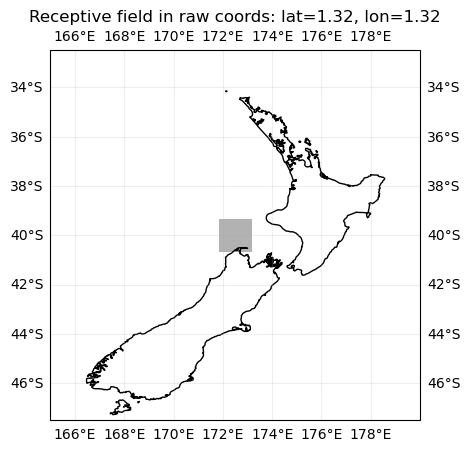

In [36]:
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cf

cartopy.config['data_dir'] = get_env_var("CARTOPY_FILES_DIR")

fig = deepsensor.plot.receptive_field(model.model.receptive_field, data_processor, ccrs.PlateCarree(), (165, 180, -47.5, -32.5))

In [37]:
logger.info("Training and validation datetime splits created. Setting up dataset pickle file paths.")

2026-02-18 21:51:54 - INFO - __main__ - Training and validation datetime splits created. Setting up dataset pickle file paths.


In [ ]:
if (not dev) and save_data_processor:
    data_processor.save(norm_dir)

In [39]:
def generate_and_save_tasks(
    datetimes,
    era5_ds,
    nzra_stations,
    nzra_target,
    data_processor,
    task_dir,
    ds_aux_coarse_processed,
    ds_aux_processed,
    logger,
    tasks_len,
    split_name,
    *,
    h8_ds=None,
    load_himawari=False,
    process_year=None,
    all_years=None,
):
    # Generate Deepsensor tasks for a given split and save them to disk.

    logger.info(f"Generating {split_name} Deepsensor tasks.")

    for i, date in enumerate(datetimes):
        # Select data for this timestep
        era5_date_ds = era5_ds.sel(time=date)
        nzra_ds_stations = nzra_stations.sel(time=date)
        nzra_ds_target = nzra_target.sel(time=date)

        if load_himawari:
            _ = h8_ds.sel(time=date)  # kept for future use

        # Process data
        era5_proc = data_processor(
            era5_date_ds
        )

        nzra_ds_stations_processed, nzra_ds_target_processed = normalizer([nzra_ds_stations, nzra_ds_target])
        nzra_ds_deepsensor = data_processor.map_coords(nzra_ds_target_processed)
        nzra_ds_stations_deepsensor = data_processor.map_coords(nzra_ds_stations_processed)

        # Build task loader
        task_loader = TaskLoader(
            context = [nzra_ds_stations_deepsensor, era5_proc, ds_aux_coarse_processed], 
            target = nzra_ds_deepsensor,
            aux_at_targets = ds_aux_processed)

        # File path logic
        if process_year is not None:
            base_idx = all_years.index(process_year) * (366 - 2) * 24
            filename = f"{base_idx + i}_0.pkl"
        else:
            filename = f"{i}_0.pkl"

        path = os.path.join(task_dir, filename)

        # Create and save task
        task = task_loader(
            date,
            context_sampling=["all", "all", "all"],
            target_sampling=["all"],
        )

        with open(path, "wb") as f:
            pickle.dump(task, f)

        if i % 10 == 0:
            logger.info(
                f"dataset generation progress: {i}/{tasks_len} {split_name} tasks completed."
            )

    logger.info(f"{split_name.capitalize()} Deepsensor task dataset generation completed.")

In [40]:
# compute lengths for logging
train_tasks_len = len(train_datetimes)
val_tasks_len = len(val_datetimes)

logger.info(f"Train dataset: {len(train_datetimes)}.")
logger.info(f"Validation dataset: {len(val_datetimes)}.")
logger.info("Dataset generation beginning.")

# you can disable dataset generation by setting the DATASET_GENERATION env var to "0"
if dataset_generation:
    logger.info("Generating and saving Deepsensor tasks to disk.")

    # generate train tasks
    generate_and_save_tasks(
        datetimes=train_datetimes,
        era5_ds=era5_ds,
        nzra_stations=nzra_ds_stations,
        nzra_target=nzra_ds,
        data_processor=data_processor,
        task_dir=train_dir,
        ds_aux_coarse_processed=ds_aux_coarse_processed,
        ds_aux_processed=ds_aux_processed,
        logger=logger,
        tasks_len=train_tasks_len,
        split_name="train",
        load_himawari=load_himawari,
        process_year=process_year,
        all_years=all_years,
    )

    # generate validation tasks
    generate_and_save_tasks(
        datetimes=val_datetimes,
        era5_ds=era5_ds,
        nzra_stations=nzra_ds_stations,
        nzra_target=nzra_ds,
        data_processor=data_processor,
        task_dir=val_dir,
        ds_aux_coarse_processed=ds_aux_coarse_processed,
        ds_aux_processed=ds_aux_processed,
        logger=logger,
        tasks_len=val_tasks_len,
        split_name="val",
        process_year=process_year,
        all_years=all_years,
    )

    logger.info("Deepsensor task dataset generation completed.")
    if not dev:
        tb_writer.add_text(
            TB_RUN_LOGS,
            "Deepsensor task dataset generation completed.",
            2,
        )
else:
    if not dev:
        tb_writer.add_text(TB_RUN_LOGS, "Deepsensor task dataset generation skipped.", 2)

2026-02-18 21:51:54 - INFO - __main__ - Train dataset: 312.
2026-02-18 21:51:54 - INFO - __main__ - Validation dataset: 312.
2026-02-18 21:51:54 - INFO - __main__ - Dataset generation beginning.


In [41]:
task_to_plot = norm_task_loader(norm_datetimes[0], context_sampling=["all", "all", "all"], target_sampling=["all"])

In [42]:
# find a lat/lon which is not null in nzra_ds_norm for testing

lat_vals = nzra_ds_norm[LATITUDE].values
lon_vals = nzra_ds_norm[LONGITUDE].values

# Find a lat/lon pair that is not null in nzra_ds_norm
for lat in lat_vals:
    for lon in lon_vals:
        if not nzra_ds_norm.drop_dims(TIME).sel(lat=lat, lon=lon).isnull().values:
            print(f"Found non-null value at lat={lat}, lon={lon}")
            break
    else:
        continue
    break

In [43]:
nzra_ds_norm.isel(time=0).sel(lat=-46.412000000000006, lon=168.318)['temperature_diff_norm']

<xarray.DataArray 'temperature_diff_norm' ()> Size: 8B
array(0.60623273)
Coordinates:
    time     datetime64[ns] 8B 2013-01-02
    lat      float64 8B -46.41
    lon      float64 8B 168.3
    level    int64 8B 1000
Attributes:
    standard_name:  air_temperature
    stash_item:     236
    stash_model:    1
    stash_section:  3
    units:          Celsius
    valid_max:      333.0
    valid_min:      230.0
    long_name:      Temperature
    short_name:     t

In [44]:
nzra_ds_stations_norm.isel(time=0).sel(lat=-46.412000000000006, lon=168.318)['temperature_diff_station_norm']

<xarray.DataArray 'temperature_diff_station_norm' ()> Size: 8B
array(0.60623273)
Coordinates:
    time     datetime64[ns] 8B 2013-01-02
    lat      float64 8B -46.41
    lon      float64 8B 168.3
    level    int64 8B 1000
Attributes:
    standard_name:  air_temperature
    stash_item:     236
    stash_model:    1
    stash_section:  3
    units:          Celsius
    valid_max:      333.0
    valid_min:      230.0
    long_name:      Temperature
    short_name:     t

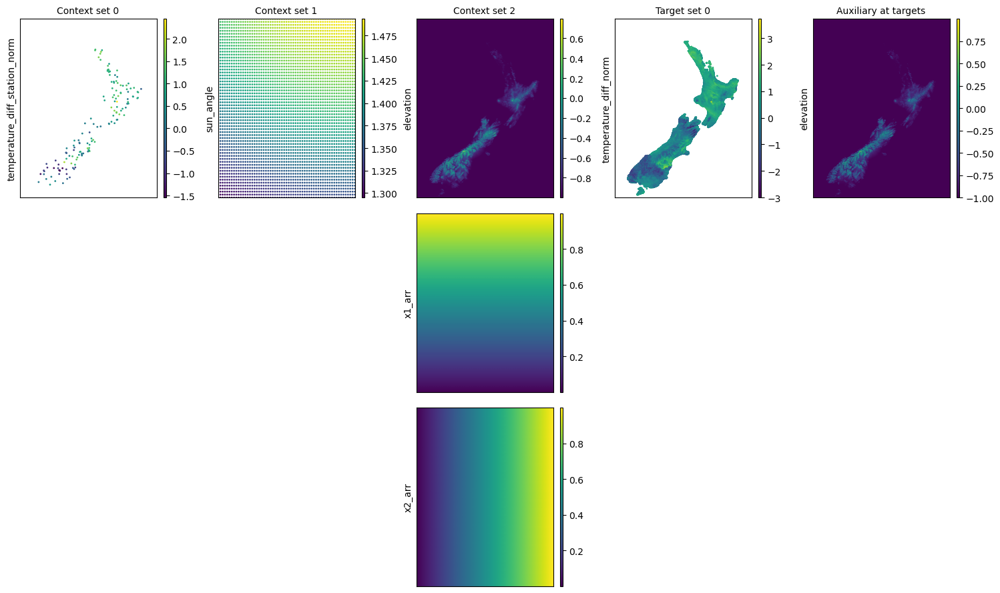

In [45]:
plot_task = deepsensor.plot.task(task_to_plot, norm_task_loader)
plot_task.show()

In [46]:
# save demo task to tensorboard
if not dev:
    tb_writer.add_figure(TB_EXAMPLE_TASK, plot_task.figure)
    tb_writer.flush()

In [47]:
from convcnp_assim_nz.learning.model_training import stations_sample_predictions

In [48]:
"""
train_date = train_datetimes[np.random.randint(0, len(train_datetimes))]
val_date = val_datetimes[np.random.randint(0, len(val_datetimes))]

# tasks are created on-the-fly here for prediction
era5_train_date_ds = era5_ds.sel(time=train_date)
nzra_date_ds = nzra_ds.sel(time=train_date).drop("time")
era5_target_field = era5_ds_with_target.sel(time=train_date)[TEMPERATURE]
stations_train_date_df = stations_resample.loc[stations_resample.index.get_level_values('time') == train_date]
stations_from_nzra = nzra_ds_stations.sel(time=train_date)

era5_val_date_ds = era5_ds_with_target.sel(time=val_date)
stations_val_date_df = stations_resample.loc[stations_resample.index.get_level_values('time') == val_date]

train_fig = stations_sample_predictions(era5_train_date_ds, 
                                era5_target_field,
                                nzra_date_ds, 
                                stations_train_date_df, 
                                stations_from_nzra,
                                ds_aux_processed, 
                                ds_aux_coarse_processed, 
                                train_date, 
                                data_processor, 
                                0+1, 
                                model, 
                                target=TEMPERATURE, 
                                custom_norm=normalizer,
                                subtitle_text=f"Train Loss: {1.00:.2f},\n Val Loss: {1.00:.2f}")

train_fig.show()
"""

'\ntrain_date = train_datetimes[np.random.randint(0, len(train_datetimes))]\nval_date = val_datetimes[np.random.randint(0, len(val_datetimes))]\n\n# tasks are created on-the-fly here for prediction\nera5_train_date_ds = era5_ds.sel(time=train_date)\nnzra_date_ds = nzra_ds.sel(time=train_date).drop("time")\nera5_target_field = era5_ds_with_target.sel(time=train_date)[TEMPERATURE]\nstations_train_date_df = stations_resample.loc[stations_resample.index.get_level_values(\'time\') == train_date]\nstations_from_nzra = nzra_ds_stations.sel(time=train_date)\n\nera5_val_date_ds = era5_ds_with_target.sel(time=val_date)\nstations_val_date_df = stations_resample.loc[stations_resample.index.get_level_values(\'time\') == val_date]\n\ntrain_fig = stations_sample_predictions(era5_train_date_ds, \n                                era5_target_field,\n                                nzra_date_ds, \n                                stations_train_date_df, \n                                stations_from_nzra

## Model Training

In [49]:
if not dev:
    tb_writer.add_hparams(
        {
            'initial_learning_rate': LR,
            'batch_size': BATCH_SIZE,
            'target_sampling_count': TARGET_SAMPLING_COUNT,
            'sampling_strategy': "all" if SAMPLING_STRATEGY == "all" else "repeated",
            'dev_mode': dev,
            'epochs': N_EPOCHS,
            'n_samples': len(train_datetimes),
            'unet': str(UNET_CHANNELS),
            'grad_clip': USE_GRAD_CLIP,
            'grad_clip_value': GRAD_CLIP_VALUE,
            'model_internal_density': INTERNAL_DENSITY,
            'model_receptive_field': model.model.receptive_field,
        },
        {}
    )

    tb_writer.add_text(TB_RUN_LOGS, f"Training started for {N_EPOCHS} epochs.", 3)
    tb_writer.flush()

In [50]:
if dataset_generation and not dev:
    logger.info("Exiting before model training.")
    tb_writer.add_text(TB_RUN_LOGS, "Exiting before model training.", 4)
    tb_writer.flush()
    
    os._exit(0)

logger.info("Model training starting.")

2026-02-18 21:54:19 - INFO - __main__ - Model training starting.


0it [00:00, ?it/s]
/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/.pixi/envs/default/lib/python3.13/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/.pixi/envs/default/lib/python3.13/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/.pixi/envs/default/lib/python3.13/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warn

-16.220444 2.2650075
Internal variables used for normalization:
residual (normalized variable: residual_norm)
temperature_diff_station (normalized variable: temperature_diff_station_norm)
temperature_diff (normalized variable: temperature_diff_norm)


/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/src/convcnp_assim_nz/data_processing/normalize/coordinate_normalizer.py:94: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  data = data.isel(time=0).drop(TIME) if TIME in data.coords else data


-16.227009 2.2525554
Internal variables used for normalization:
residual (normalized variable: residual_norm)
temperature_diff_station (normalized variable: temperature_diff_station_norm)
temperature_diff (normalized variable: temperature_diff_norm)


0it [00:00, ?it/s]
/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/.pixi/envs/default/lib/python3.13/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/.pixi/envs/default/lib/python3.13/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
0it [00:00, ?it/s]
2026-02-18 21:54:34 - INFO - __main__ - Epoch 2 train_loss: nan, val_loss: nan
/var/tmp/pbs.1632954.pbsserver01/ipykernel_3485076/12514741.py:63: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  nzra_train_date_ds = nzra_ds.sel(time=train_date).drop("time")
/var/tmp/pbs.1632954.pbsserver01/ipykernel_3485076/12514741.py:69: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  nzra_val_date_ds = nzra_ds.sel(time=val_date).drop("time")


/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/src/convcnp_assim_nz/data_processing/normalize/coordinate_normalizer.py:94: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  data = data.isel(time=0).drop(TIME) if TIME in data.coords else data


-16.223364 2.2558243
Internal variables used for normalization:
residual (normalized variable: residual_norm)
temperature_diff_station (normalized variable: temperature_diff_station_norm)
temperature_diff (normalized variable: temperature_diff_norm)


/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/src/convcnp_assim_nz/data_processing/normalize/coordinate_normalizer.py:94: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  data = data.isel(time=0).drop(TIME) if TIME in data.coords else data


-16.220839 2.2650177
Internal variables used for normalization:
residual (normalized variable: residual_norm)
temperature_diff_station (normalized variable: temperature_diff_station_norm)
temperature_diff (normalized variable: temperature_diff_norm)


0it [00:00, ?it/s]
/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/.pixi/envs/default/lib/python3.13/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/.pixi/envs/default/lib/python3.13/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
0it [00:00, ?it/s]
2026-02-18 21:54:47 - INFO - __main__ - Epoch 3 train_loss: nan, val_loss: nan
/var/tmp/pbs.1632954.pbsserver01/ipykernel_3485076/12514741.py:63: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  nzra_train_date_ds = nzra_ds.sel(time=train_date).drop("time")
/var/tmp/pbs.1632954.pbsserver01/ipykernel_3485076/12514741.py:69: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  nzra_val_date_ds = nzra_ds.sel(time=val_date).drop("time")
/esi/proj

-16.219292 2.266093
Internal variables used for normalization:
residual (normalized variable: residual_norm)
temperature_diff_station (normalized variable: temperature_diff_station_norm)
temperature_diff (normalized variable: temperature_diff_norm)


/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/src/convcnp_assim_nz/data_processing/normalize/coordinate_normalizer.py:94: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  data = data.isel(time=0).drop(TIME) if TIME in data.coords else data


-16.219933 2.2712789
Internal variables used for normalization:
residual (normalized variable: residual_norm)
temperature_diff_station (normalized variable: temperature_diff_station_norm)
temperature_diff (normalized variable: temperature_diff_norm)


0it [00:00, ?it/s]
/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/.pixi/envs/default/lib/python3.13/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/.pixi/envs/default/lib/python3.13/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
0it [00:00, ?it/s]
2026-02-18 21:55:01 - INFO - __main__ - Epoch 4 train_loss: nan, val_loss: nan
/var/tmp/pbs.1632954.pbsserver01/ipykernel_3485076/12514741.py:63: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  nzra_train_date_ds = nzra_ds.sel(time=train_date).drop("time")
/var/tmp/pbs.1632954.pbsserver01/ipykernel_3485076/12514741.py:69: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  nzra_val_date_ds = nzra_ds.sel(time=val_date).drop("time")
/esi/proj

-16.22431 2.2554631
Internal variables used for normalization:
residual (normalized variable: residual_norm)
temperature_diff_station (normalized variable: temperature_diff_station_norm)
temperature_diff (normalized variable: temperature_diff_norm)


/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/src/convcnp_assim_nz/data_processing/normalize/coordinate_normalizer.py:94: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  data = data.isel(time=0).drop(TIME) if TIME in data.coords else data


-16.21949 2.2690463
Internal variables used for normalization:
residual (normalized variable: residual_norm)
temperature_diff_station (normalized variable: temperature_diff_station_norm)
temperature_diff (normalized variable: temperature_diff_norm)


0it [00:00, ?it/s]
/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/.pixi/envs/default/lib/python3.13/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/.pixi/envs/default/lib/python3.13/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
0it [00:00, ?it/s]
2026-02-18 21:55:14 - INFO - __main__ - Epoch 5 train_loss: nan, val_loss: nan
/var/tmp/pbs.1632954.pbsserver01/ipykernel_3485076/12514741.py:63: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  nzra_train_date_ds = nzra_ds.sel(time=train_date).drop("time")
/var/tmp/pbs.1632954.pbsserver01/ipykernel_3485076/12514741.py:69: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  nzra_val_date_ds = nzra_ds.sel(time=val_date).drop("time")
/esi/proj

-16.222313 2.2578456
Internal variables used for normalization:
residual (normalized variable: residual_norm)
temperature_diff_station (normalized variable: temperature_diff_station_norm)
temperature_diff (normalized variable: temperature_diff_norm)


/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/src/convcnp_assim_nz/data_processing/normalize/coordinate_normalizer.py:94: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  data = data.isel(time=0).drop(TIME) if TIME in data.coords else data


-16.22046 2.264072
Internal variables used for normalization:
residual (normalized variable: residual_norm)
temperature_diff_station (normalized variable: temperature_diff_station_norm)
temperature_diff (normalized variable: temperature_diff_norm)


0it [00:00, ?it/s]
/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/.pixi/envs/default/lib/python3.13/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/.pixi/envs/default/lib/python3.13/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
0it [00:00, ?it/s]
2026-02-18 21:55:26 - INFO - __main__ - Epoch 6 train_loss: nan, val_loss: nan
/var/tmp/pbs.1632954.pbsserver01/ipykernel_3485076/12514741.py:63: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  nzra_train_date_ds = nzra_ds.sel(time=train_date).drop("time")
/var/tmp/pbs.1632954.pbsserver01/ipykernel_3485076/12514741.py:69: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  nzra_val_date_ds = nzra_ds.sel(time=val_date).drop("time")
/esi/proj

-16.220062 2.2656097
Internal variables used for normalization:
residual (normalized variable: residual_norm)
temperature_diff_station (normalized variable: temperature_diff_station_norm)
temperature_diff (normalized variable: temperature_diff_norm)


/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/src/convcnp_assim_nz/data_processing/normalize/coordinate_normalizer.py:94: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  data = data.isel(time=0).drop(TIME) if TIME in data.coords else data


-16.225798 2.254171
Internal variables used for normalization:
residual (normalized variable: residual_norm)
temperature_diff_station (normalized variable: temperature_diff_station_norm)
temperature_diff (normalized variable: temperature_diff_norm)


0it [00:00, ?it/s]
/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/.pixi/envs/default/lib/python3.13/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/.pixi/envs/default/lib/python3.13/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
0it [00:00, ?it/s]
2026-02-18 21:55:39 - INFO - __main__ - Epoch 7 train_loss: nan, val_loss: nan
/var/tmp/pbs.1632954.pbsserver01/ipykernel_3485076/12514741.py:63: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  nzra_train_date_ds = nzra_ds.sel(time=train_date).drop("time")
/var/tmp/pbs.1632954.pbsserver01/ipykernel_3485076/12514741.py:69: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  nzra_val_date_ds = nzra_ds.sel(time=val_date).drop("time")
/esi/proj

-16.219261 2.2680492
Internal variables used for normalization:
residual (normalized variable: residual_norm)
temperature_diff_station (normalized variable: temperature_diff_station_norm)
temperature_diff (normalized variable: temperature_diff_norm)


/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/src/convcnp_assim_nz/data_processing/normalize/coordinate_normalizer.py:94: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  data = data.isel(time=0).drop(TIME) if TIME in data.coords else data


-16.224077 2.25569
Internal variables used for normalization:
residual (normalized variable: residual_norm)
temperature_diff_station (normalized variable: temperature_diff_station_norm)
temperature_diff (normalized variable: temperature_diff_norm)


0it [00:00, ?it/s]
/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/.pixi/envs/default/lib/python3.13/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/.pixi/envs/default/lib/python3.13/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
0it [00:00, ?it/s]
2026-02-18 21:55:53 - INFO - __main__ - Epoch 8 train_loss: nan, val_loss: nan
/var/tmp/pbs.1632954.pbsserver01/ipykernel_3485076/12514741.py:63: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  nzra_train_date_ds = nzra_ds.sel(time=train_date).drop("time")
/var/tmp/pbs.1632954.pbsserver01/ipykernel_3485076/12514741.py:69: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  nzra_val_date_ds = nzra_ds.sel(time=val_date).drop("time")
/esi/proj

-16.220442 2.2639887
Internal variables used for normalization:
residual (normalized variable: residual_norm)
temperature_diff_station (normalized variable: temperature_diff_station_norm)
temperature_diff (normalized variable: temperature_diff_norm)


/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/src/convcnp_assim_nz/data_processing/normalize/coordinate_normalizer.py:94: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  data = data.isel(time=0).drop(TIME) if TIME in data.coords else data


-16.220432 2.2642448
Internal variables used for normalization:
residual (normalized variable: residual_norm)
temperature_diff_station (normalized variable: temperature_diff_station_norm)
temperature_diff (normalized variable: temperature_diff_norm)


0it [00:00, ?it/s]
/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/.pixi/envs/default/lib/python3.13/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/.pixi/envs/default/lib/python3.13/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
0it [00:00, ?it/s]
2026-02-18 21:56:06 - INFO - __main__ - Epoch 9 train_loss: nan, val_loss: nan
/var/tmp/pbs.1632954.pbsserver01/ipykernel_3485076/12514741.py:63: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  nzra_train_date_ds = nzra_ds.sel(time=train_date).drop("time")
/var/tmp/pbs.1632954.pbsserver01/ipykernel_3485076/12514741.py:69: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  nzra_val_date_ds = nzra_ds.sel(time=val_date).drop("time")
/esi/proj

-16.22038 2.2639391
Internal variables used for normalization:
residual (normalized variable: residual_norm)
temperature_diff_station (normalized variable: temperature_diff_station_norm)
temperature_diff (normalized variable: temperature_diff_norm)


/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/src/convcnp_assim_nz/data_processing/normalize/coordinate_normalizer.py:94: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  data = data.isel(time=0).drop(TIME) if TIME in data.coords else data


-16.226187 2.2537112
Internal variables used for normalization:
residual (normalized variable: residual_norm)
temperature_diff_station (normalized variable: temperature_diff_station_norm)
temperature_diff (normalized variable: temperature_diff_norm)


0it [00:00, ?it/s]
/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/.pixi/envs/default/lib/python3.13/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/.pixi/envs/default/lib/python3.13/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
0it [00:00, ?it/s]
2026-02-18 21:56:19 - INFO - __main__ - Epoch 10 train_loss: nan, val_loss: nan
/var/tmp/pbs.1632954.pbsserver01/ipykernel_3485076/12514741.py:63: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  nzra_train_date_ds = nzra_ds.sel(time=train_date).drop("time")
/var/tmp/pbs.1632954.pbsserver01/ipykernel_3485076/12514741.py:69: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  nzra_val_date_ds = nzra_ds.sel(time=val_date).drop("time")
/esi/pro

-16.220068 2.263379
Internal variables used for normalization:
residual (normalized variable: residual_norm)
temperature_diff_station (normalized variable: temperature_diff_station_norm)
temperature_diff (normalized variable: temperature_diff_norm)


/esi/project/niwa00004/crowelenn/dev/convcnp-assim-nz/src/convcnp_assim_nz/data_processing/normalize/coordinate_normalizer.py:94: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  data = data.isel(time=0).drop(TIME) if TIME in data.coords else data


-16.219574 2.2705138
Internal variables used for normalization:
residual (normalized variable: residual_norm)
temperature_diff_station (normalized variable: temperature_diff_station_norm)
temperature_diff (normalized variable: temperature_diff_norm)


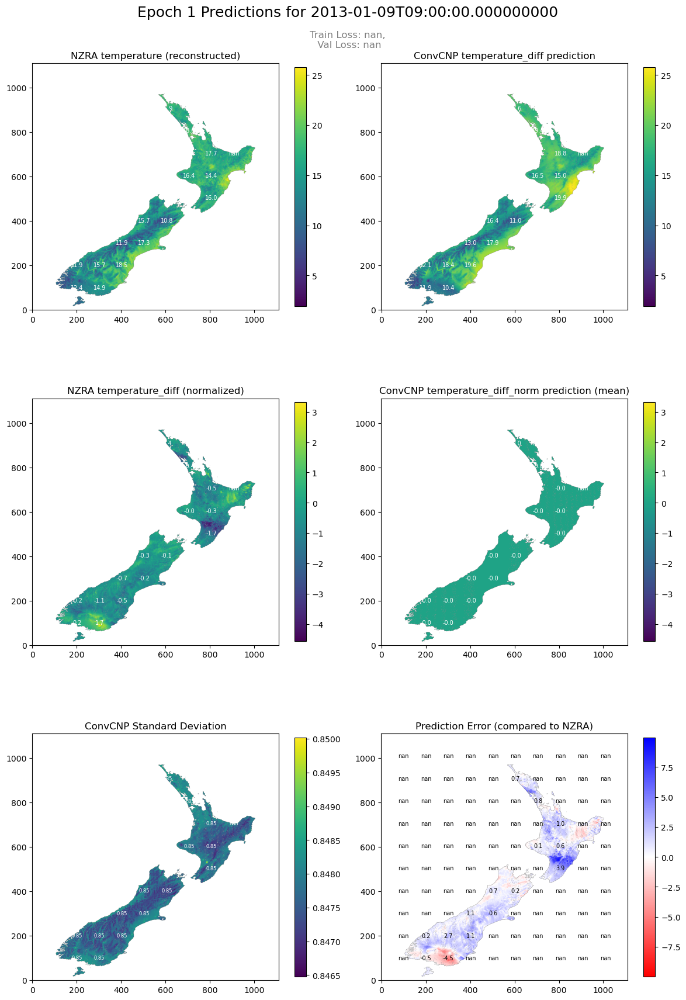

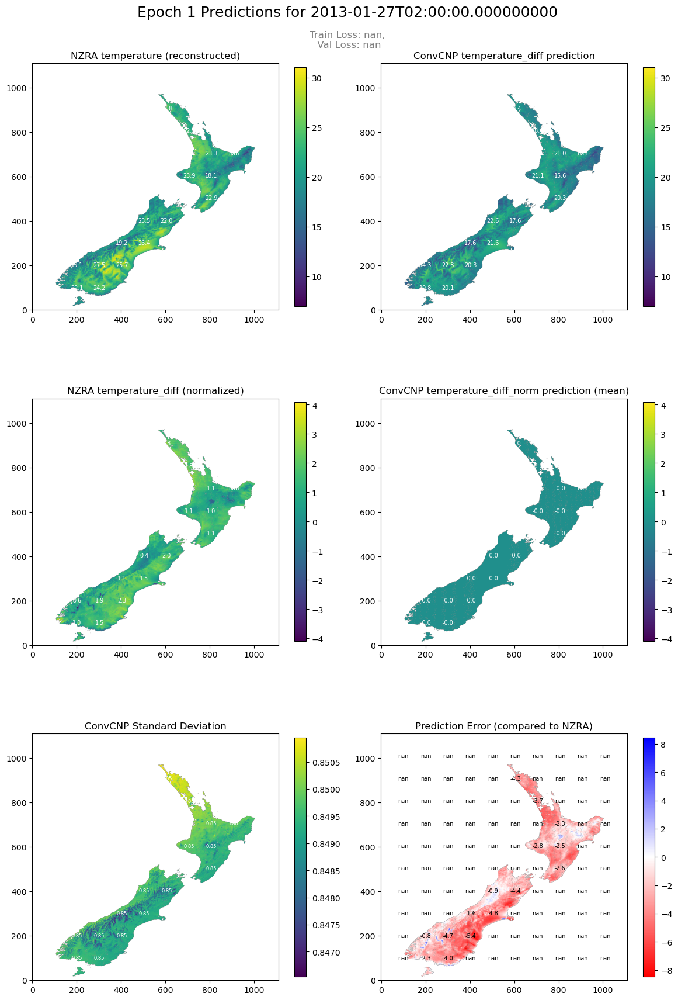

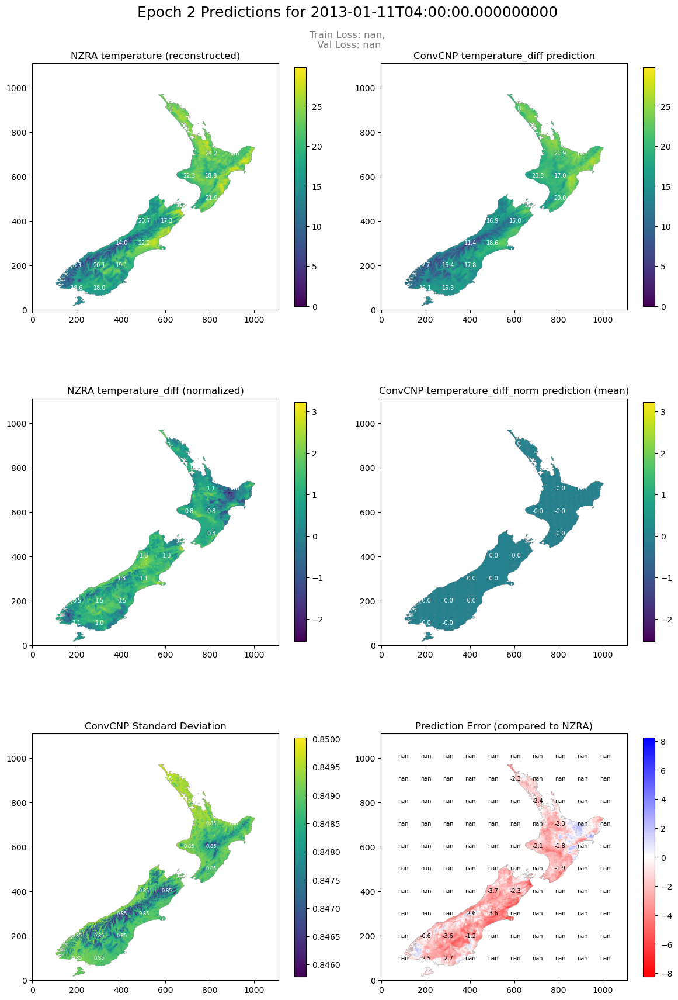

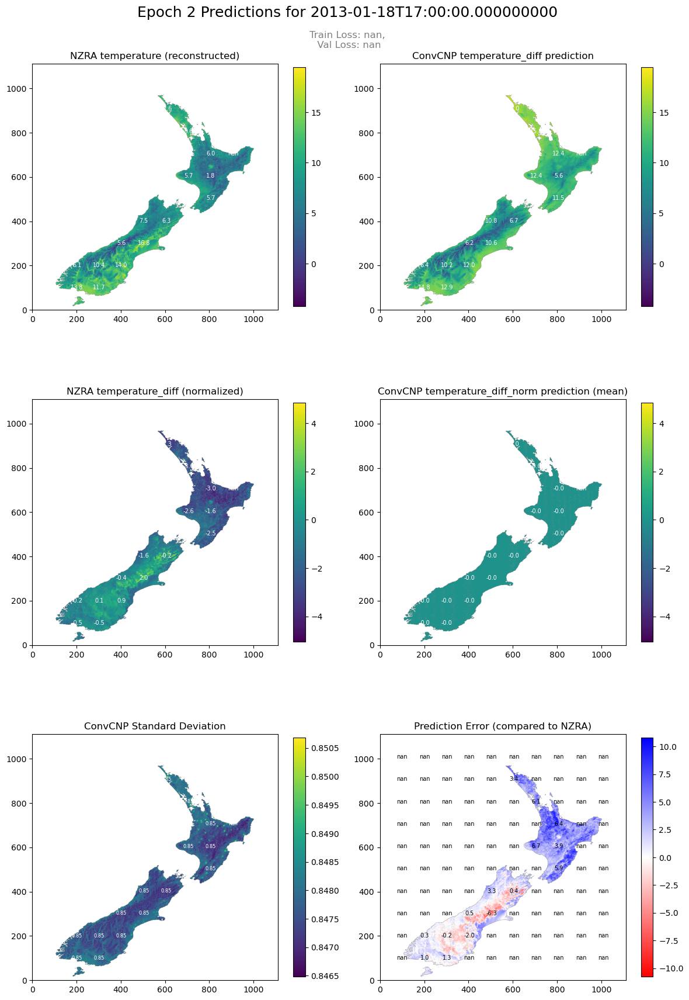

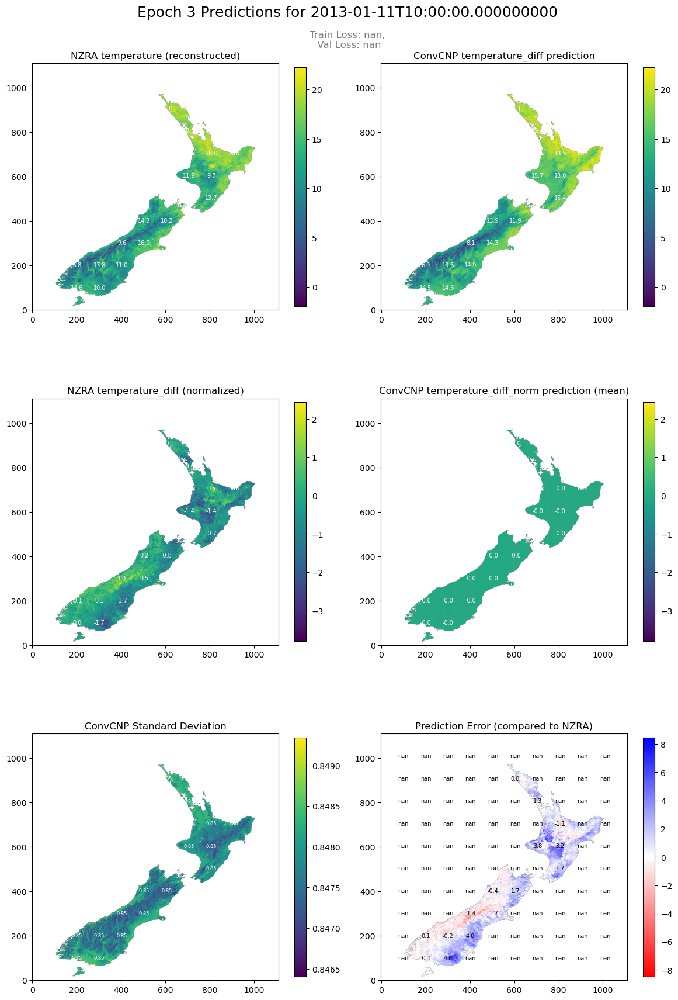

...

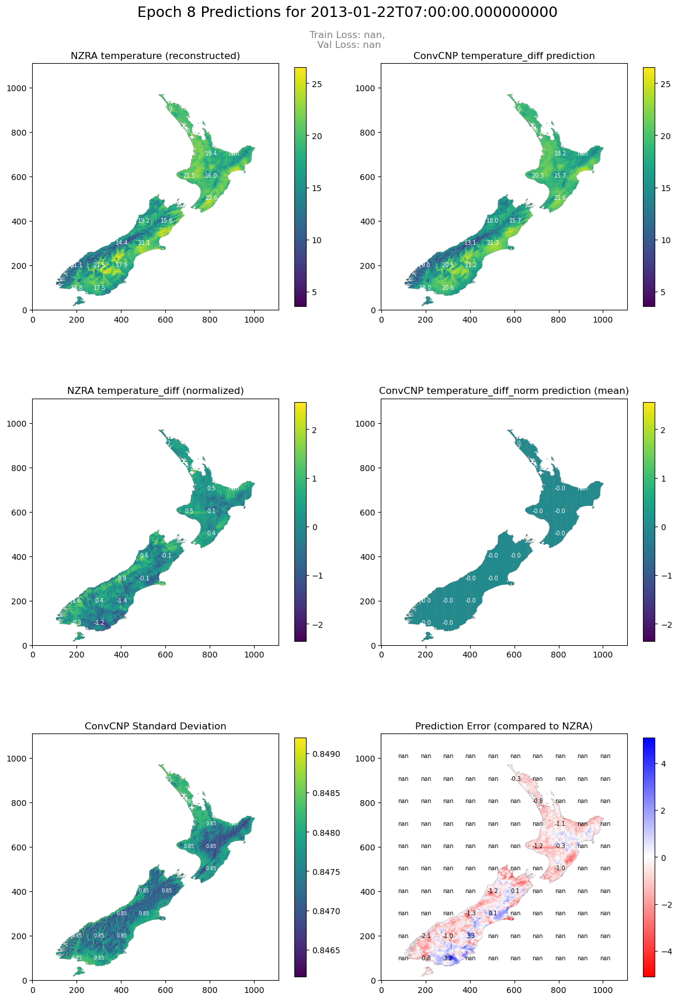

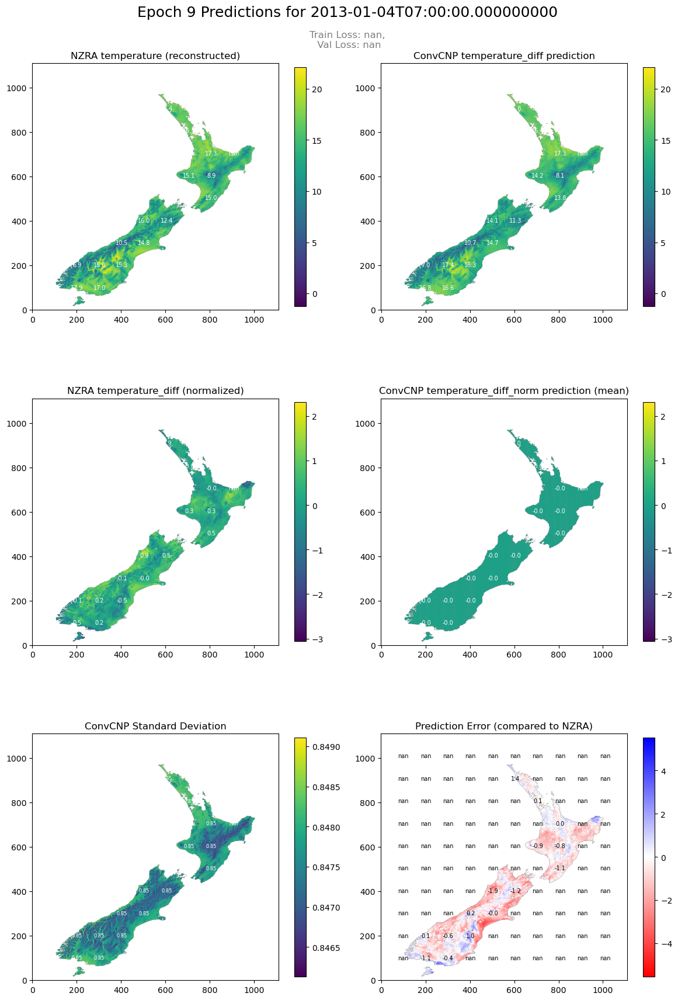

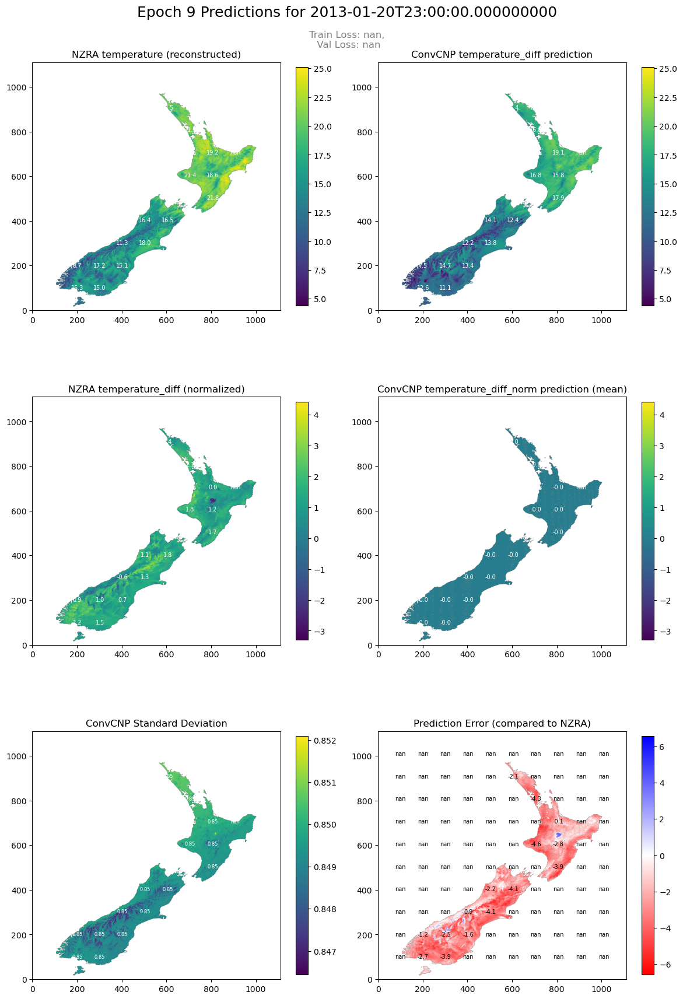

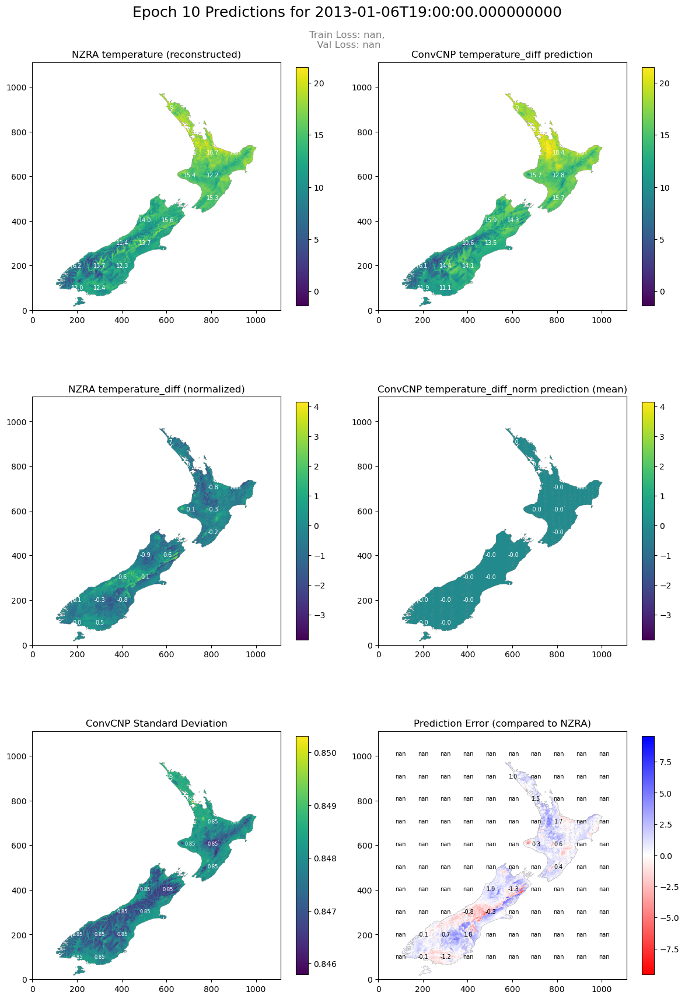

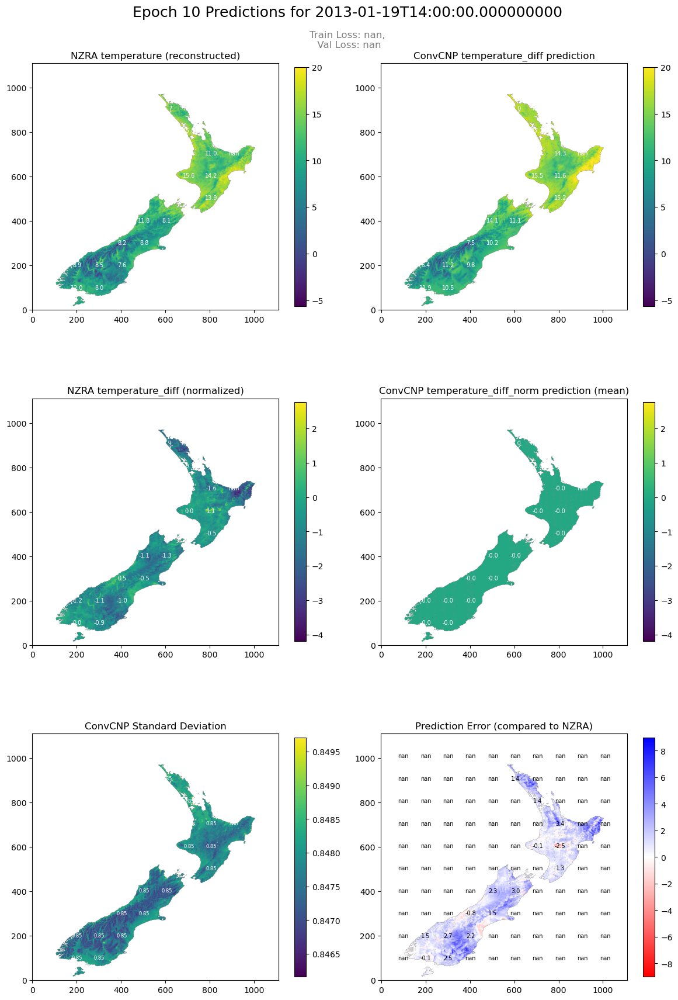

In [51]:
# save the initial untrained model
if not dev:
    model_save_path = os.path.join(model_dir, "initial_model")
    torch.save(model.model.state_dict(), model_save_path + ".pt")

# training loop
opt = Adam(model.model.parameters(), lr=LR)
scheduler = CosineAnnealingLR(opt, T_max=N_EPOCHS)
subsample_targets = None if SAMPLING_STRATEGY == "all" else TARGET_SAMPLING_COUNT

for epoch in range(N_EPOCHS):

    if epoch < UNFIX_NOISE_AT_EPOCH:
        noise_value = INITIAL_NOISE
    else:
        noise_value = None

    batch_losses = train_epoch_pickled(model, 
                                       train_dir, 
                                       opt, 
                                       batch_size=BATCH_SIZE, 
                                       epoch=epoch, 
                                       use_grad_clip=USE_GRAD_CLIP, 
                                       grad_clip_value=GRAD_CLIP_VALUE,
                                       grad_accum_steps=GRAD_ACCUM_STEPS,
                                       fix_noise=noise_value,
                                       n_subsample_targets=subsample_targets)
    
    train_loss = np.mean(batch_losses)

    scheduler.step()

    if not dev:
        tb_writer.add_scalar(TB_TRAIN_LOSS, train_loss, epoch+1)
        tb_writer.add_scalar(TB_CUDA_MEM, torch.cuda.max_memory_reserved()/1024**2, epoch+1)
        tb_writer.add_scalar(TB_LEARNING_RATE, opt.param_groups[0]['lr'], epoch+1)
        tb_writer.flush()
    
    if (epoch + 1) % CHECKPOINT_EVERY == 0:
        # checkpoint the model
        if not dev:
            model_save_path = os.path.join(checkpoint_dir, f"model_epoch_{epoch+1}")
            torch.save(model.model.state_dict(), model_save_path + ".pt")

    if (epoch + 1) % VAL_EVERY == 0:

        with torch.no_grad():
            val_loss = compute_val_loss_pickled(model, val_dir, batch_size=BATCH_SIZE, epoch=epoch, fix_noise=noise_value, n_subsample_targets=subsample_targets)
            if not dev:
                tb_writer.add_scalar(TB_VAL_LOSS, val_loss, epoch+1)
                tb_writer.flush()

            logger.info(f"Epoch {epoch+1} train_loss: {train_loss:.2f}, val_loss: {val_loss:.2f}")

            # do sample predictions and log to tensorboard
            
            # first, select a random validation task from the list of validaiton dates
            train_date = train_datetimes[np.random.randint(0, len(train_datetimes))]
            val_date = val_datetimes[np.random.randint(0, len(val_datetimes))]

            # tasks are created on-the-fly here for prediction
            era5_train_date_ds = era5_ds.sel(time=train_date)
            nzra_train_date_ds = nzra_ds.sel(time=train_date).drop("time")
            era5_train_target_field = era5_ds_with_target.sel(time=train_date)[TEMPERATURE]
            stations_train_date_df = stations_resample.loc[stations_resample.index.get_level_values('time') == train_date]
            stations_train_from_nzra = nzra_ds_stations.sel(time=train_date)

            era5_val_date_ds = era5_ds.sel(time=val_date)
            nzra_val_date_ds = nzra_ds.sel(time=val_date).drop("time")
            era5_val_target_field = era5_ds_with_target.sel(time=val_date)[TEMPERATURE]
            stations_val_date_df = stations_resample.loc[stations_resample.index.get_level_values('time') == val_date]
            stations_val_from_nzra = nzra_ds_stations.sel(time=val_date)

            for var in target_variable:
                train_fig = stations_sample_predictions(era5_train_date_ds, 
                                                era5_train_target_field,
                                                nzra_train_date_ds, 
                                                stations_train_date_df, 
                                                stations_train_from_nzra,
                                                ds_aux_processed, 
                                                ds_aux_coarse_processed, 
                                                train_date, 
                                                data_processor, 
                                                epoch+1, 
                                                model, 
                                                target=var, 
                                                custom_norm=normalizer,
                                                subtitle_text=f"Train Loss: {train_loss:.2f},\n Val Loss: {val_loss:.2f}")
                
                val_fig = stations_sample_predictions(era5_val_date_ds, 
                                                era5_val_target_field,
                                                nzra_val_date_ds, 
                                                stations_val_date_df, 
                                                stations_val_from_nzra,
                                                ds_aux_processed, 
                                                ds_aux_coarse_processed, 
                                                val_date, 
                                                data_processor, 
                                                epoch+1, 
                                                model, 
                                                target=var, 
                                                custom_norm=normalizer,
                                                subtitle_text=f"Train Loss: {train_loss:.2f},\n Val Loss: {val_loss:.2f}")
            
                if not dev:
                    tb_writer.add_figure(f"{TB_PREDICTIONS_TRAIN_PLOT}_{var}", train_fig, epoch+1)
                    tb_writer.add_figure(f"{TB_PREDICTIONS_VAL_PLOT}_{var}", val_fig, epoch+1)
                    tb_writer.flush()

In [52]:
logger.info("Model training and notebook execution completed.")

if not dev:
    tb_writer.add_text(TB_RUN_LOGS, "Model training and notebook execution completed.", 4)
    tb_writer.flush()

2026-02-18 21:57:01 - INFO - __main__ - Model training and notebook execution completed.
